# (10) OOD: MNIST -> CelebA

host = ```any```, device = ```cuda:1```

**Motivation**:  <br>


In [1]:
# HIDE CODE


project_name = '_TemporalSC'


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-progress-2025/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-progress-2025/figs')
tmp_dir = os.path.join(git_dir, 'jb-progress-2025/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, project_name))
from figures.convergence import plot_convergence
from main.config_defaults import default_configs
from figures.fighelper import *
from main.train import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 1
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:1  ———  host: chewie

## Setup

In [3]:
from base.helper import filter_boundaries
from utils.animation import animate_recons


anim_dir = pjoin(tmp_dir, 'animations/ood')
os.makedirs(anim_dir, exist_ok=True)

print(sorted(os.listdir(anim_dir)))

[
    'Kyoto-wht+translate-to-CelebA138_kms-(512,56,3)_fwd-(1,3)_speed-2.0.mp4',
    'MNIST+rotate-to-CelebA100_kms-(192,41,3)_fwd-(3,7)_dtheta-4.0.mp4',
    'MNIST+rotate-to-CelebA138_cherrypicked_kms-(192,58,3)_fwd-(3,7)_dtheta-4.0.mp4',
    'MNIST+rotate-to-CelebA138_ids-{6,341,53,153,318,255}_kms-(512,58,3)_fwd-(1,3)_dtheta-4.0.mp4',
    'MNIST+rotate-to-CelebA138_kms-(192,58,3)_fwd-(3,0)_dtheta-4.0.mp4',
    'MNIST+rotate-to-CelebA138_kms-(192,58,3)_fwd-(3,5)_dtheta-4.0.mp4',
    'MNIST+rotate-to-CelebA138_kms-(192,58,3)_fwd-(3,7)_dtheta-4.0.mp4',
    'MNIST+rotate-to-ImageNet32_kms-(192,8,3)_fwd-(3,7)_dtheta-15.mp4',
    'MNIST+rotate-to-ImageNet32_kms-(192,8,3)_fwd-(3,7)_dtheta-4.0.mp4',
    'MNIST+rotate-to-ImageNet32_kms-(192,8,3)_fwd-(3,7)_dtheta-4.0_FULL.mp4',
    'MNIST+rotate-to-ImageNet32_kms-(192,8,3)_fwd-(3,7)_dtheta=2.0.mp4',
    'MNIST+rotate-to-ImageNet32_kms-(192,8,3)_fwd-(3,7)_dtheta=4.0.mp4',
    'all_samples'
]

## Load model (MNIST)

In [4]:
from analysis.final import get_list_of_fits

patterns = ['MNIST+rotate_t-(16,8,4)', 'kms-(512,8,3)', 'fwd-(1,3)']
fits, root = get_list_of_fits(patterns)
print(fits)

['poisson_<ngd|lin>_MNIST+rotate_t-(16,8,4)_b-1_kms-(512,8,3)_fwd-(1,3)_recon-mse_yoru-0_(2025_09_10,10:35)']

In [5]:
fit = 'poisson_<ngd|lin>_MNIST+rotate_t-(16,8,4)_b-1_kms-(512,8,3)_fwd-(1,3)_recon-mse_yoru-0_(2025_09_10,10:35)'
tr, meta = load_model_lite(pjoin(root, fit), device=device)
tr.print()

poisson_MNIST+rotate_t-(16,8,4)_b-1_kms-(512,8,3)_fwd-(1,3)_<ngd|lin>
b100-ep50-lr(0.001)_temp(0.05)_gr(250)_(2025_09_10,10:35)

### sanity check

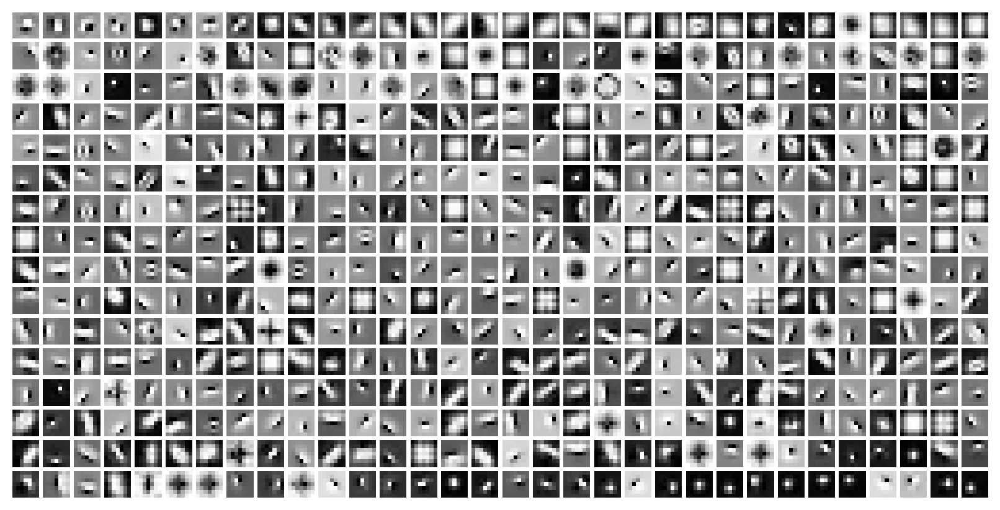

In [6]:
tr.model.show(order='u0');

In [7]:
dt_str = '\n'.join([
    f"dt_enc = {tr.model.layer.log_dt_enc[0].exp().item():0.3f}",
    f"dt_fwd = {tr.model.layer.log_dt_fwd[0].exp().item():0.3f}",
])
print(dt_str)

dt_enc = 0.412
dt_fwd = 1.878

batch #99, (t = 999): 100%|█████████| 100/100 [05:05<00:00,  3.06s/it]


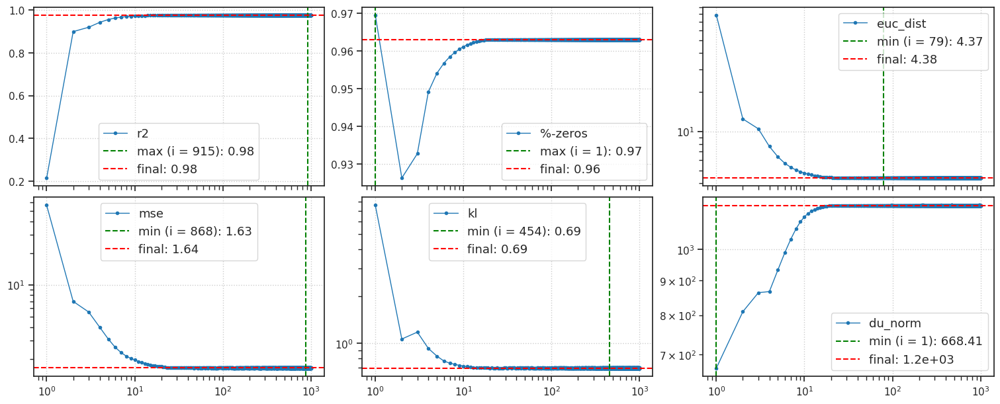

CPU times: user 5min 8s, sys: 8.74 s, total: 5min 17s
Wall time: 5min 6s


In [8]:
%%time

results = tr.analysis('vld', t_total=1000, n_data_batches=-1)
_ = plot_convergence(results=results, color='C0')

## prepare CelebA data

### compute mnist variance mask

In [6]:
sigma = tr.data_dependent_init(
    t_total=300,
    n_data_batches=5,
    data_batch_sz=2_000,
    dry_run=True,
    verbose=True,
)

batch #5, (t = 300): 100%|██████████████| 5/5 [00:01<00:00,  3.26it/s]


In [7]:
var_mnist = tonp(torch.square(sigma.squeeze()))
mask_mnist = var_mnist / np.max(var_mnist)

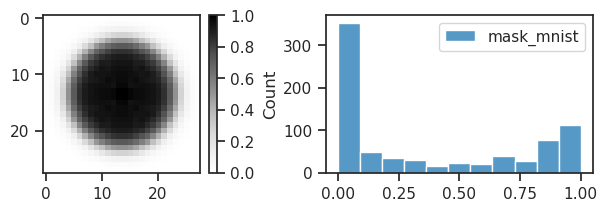

In [8]:
fig, axes = create_figure(1, 2, (6, 2), width_ratios=[1, 1.5])

im = axes[0].imshow(mask_mnist, cmap='Greys')
plt.colorbar(im, ax=axes[0])

sns.histplot(mask_mnist.ravel(), label='mask_mnist', ax=axes[1])
axes[1].legend()

plt.show()

### get celeba dataloader

In [9]:
%%time

_, vld, _ = make_dataset('CelebA', device='cpu', skip_trn=True)

CPU times: user 8.37 s, sys: 1min 17s, total: 1min 25s
Wall time: 29.3 s


In [10]:
n_samples = 360

x = vld[0][:n_samples]
x_shift_scaled = (x + 1.0) / 2.0

x_shift_scaled.shape

torch.Size([360, 3, 178, 178])

In [11]:
weights = torch.tensor(
    [0.299, 0.587, 0.114],
    device=x_shift_scaled.device,
    dtype=x_shift_scaled.dtype,
).view(1, 3, 1, 1)

# rescale to [0, 1], grayscale
# w/ BT.601 luma, keep channel dim
x_gray = torch.sum(
    x_shift_scaled * weights,
    dim=1, keepdim=True,
)

x_gray = x_gray.clamp(0, 1)
x_gray.shape

torch.Size([360, 1, 178, 178])

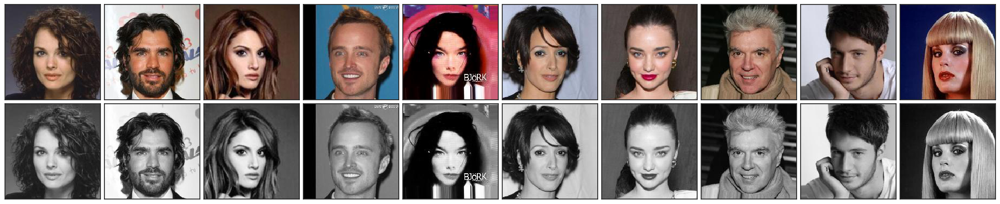

In [12]:
nrows, ncols = 2, 10
fig, axes = create_figure(nrows, ncols, (2 * ncols, 2 * nrows), 'all', 'all')

for i in range(ncols):
    x2p = np.transpose(tonp(x_shift_scaled[i]), (1, 2, 0))
    axes[0, i].imshow(x2p)
    
    x2p = tonp(x_gray[i].squeeze())
    axes[1, i].imshow(x2p, cmap='Greys_r', vmin=0, vmax=1)

remove_ticks(axes, False)
plt.show()

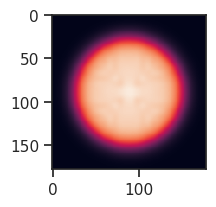

In [13]:
new_stim_dim = x_shift_scaled.shape[-1]

mask_mnist_up = F_vis.resize(
    torch.tensor(mask_mnist).unsqueeze(0),
    size=[new_stim_dim, new_stim_dim],
    interpolation=F_vis.InterpolationMode.BICUBIC,
    antialias=True,
).squeeze()
mask_mnist_up = tonp(mask_mnist_up)
mask_mnist_up = mask_mnist_up / np.max(mask_mnist_up)

imshow(mask_mnist_up, vmin=0, vmax=1);

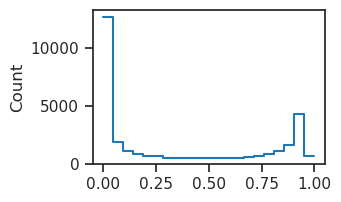

In [14]:
histplot(mask_mnist_up.ravel());

In [15]:
mask_tensor = torch.tensor(
    data=mask_mnist_up,
    device=x_gray.device,
    dtype=x_gray.dtype,
).unsqueeze(0).unsqueeze(0)

x_gray_masked = x_gray * mask_tensor

x_gray_masked.shape

torch.Size([360, 1, 178, 178])

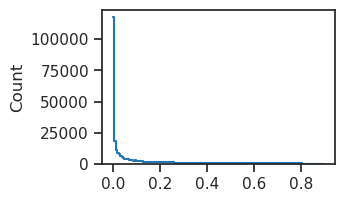

In [16]:
histplot(x_gray_masked[:10].ravel());

In [17]:
np.quantile(x_gray_masked[:100].ravel(), q=0.99)

0.765519624352455

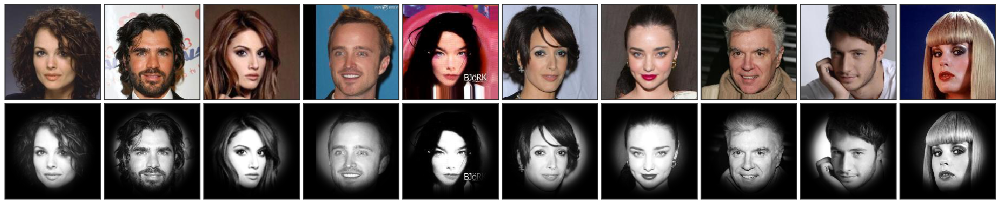

In [18]:
nrows, ncols = 2, 10
fig, axes = create_figure(nrows, ncols, (2 * ncols, 2 * nrows), 'all', 'all')

for i in range(ncols):
    x2p = np.transpose(tonp(x_shift_scaled[i]), (1, 2, 0))
    axes[0, i].imshow(x2p)
    
    x2p = tonp(x_gray_masked[i].squeeze())
    axes[1, i].imshow(x2p, cmap='Greys_r', vmin=0, vmax=0.75)

remove_ticks(axes, False)
plt.show()

In [19]:
fit = 'poisson_<ngd|lin>_MNIST+rotate_t-(16,8,4)_b-1_kms-(512,8,3)_fwd-(1,3)_recon-mse_yoru-0_(2025_09_10,10:35)'
tr, meta = load_model_lite(pjoin(root, fit), device=device)
tr.print()

poisson_MNIST+rotate_t-(16,8,4)_b-1_kms-(512,8,3)_fwd-(1,3)_<ngd|lin>
b100-ep50-lr(0.001)_temp(0.05)_gr(250)_(2025_09_10,10:35)

In [20]:
df = tr.model.update_model_dims(x_gray_masked.shape[-1])

print(df)
print(tr.model.layer.dec)

mode  computed       parameter  value
0  deconv      True      input_size     58
1  deconv     False     output_size    178
2  deconv     False     kernel_size      7
3  deconv     False          stride      3
4  deconv     False         padding      0
5  deconv     False  output_padding      0

ConvDictionary(in_channels=512, out_channels=1, kernel_size=7, stride=3)

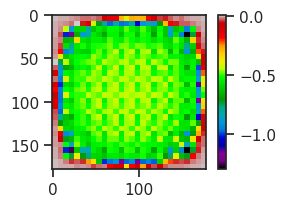

In [21]:
imshow(tr.model.layer.dec_log_sigma.squeeze(), cmap='nipy_spectral')
plt.colorbar();

### get celeba feeder

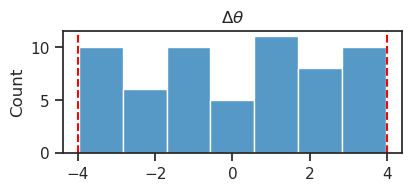

In [22]:
feeder_celeba = tr.feeder_vld.fork(
    reinit=True,
    x=x_gray_masked,
    y=vld[1],
    shuffle=False,
    drop_last=False,
    batch_size=60,
    # max_delta_theta=2.0,
)
d_thetas = feeder_celeba.apply_anneal(-1)

fig, ax = create_figure(1, 1, (4, 1.8))
sns.histplot(tonp(d_thetas), ax=ax)
ax.axvline(-feeder_celeba.max_delta_theta, color='r', ls='--')
ax.axvline(feeder_celeba.max_delta_theta, color='r', ls='--')
ax.set_title(r"$\Delta \theta$")
plt.show()

batch #5, (t = 99): 100%|███████████████| 6/6 [00:34<00:00,  5.70s/it]


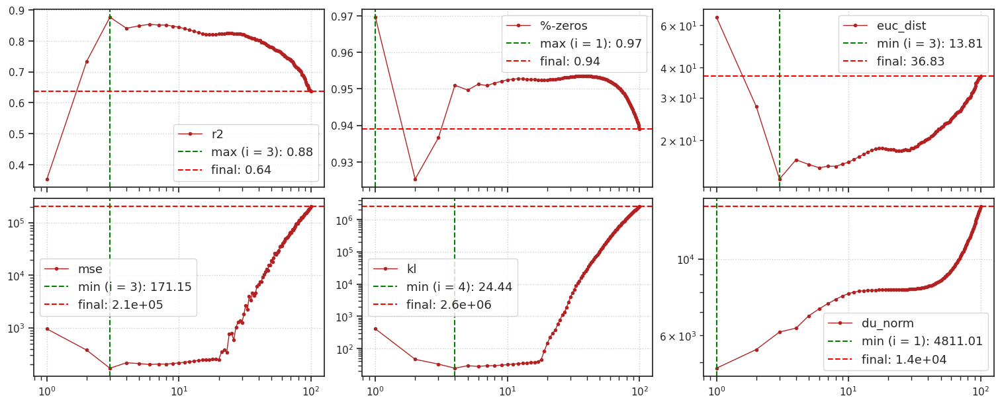

CPU times: user 34.1 s, sys: 1.34 s, total: 35.5 s
Wall time: 35.4 s


In [23]:
%%time

results = tr.analysis(feeder_celeba, t_total=100, n_data_batches=-1, verbose=True)
_ = plot_convergence(results=results, color='firebrick')

batch #5, (t = 99): 100%|███████████████| 6/6 [00:33<00:00,  5.64s/it]


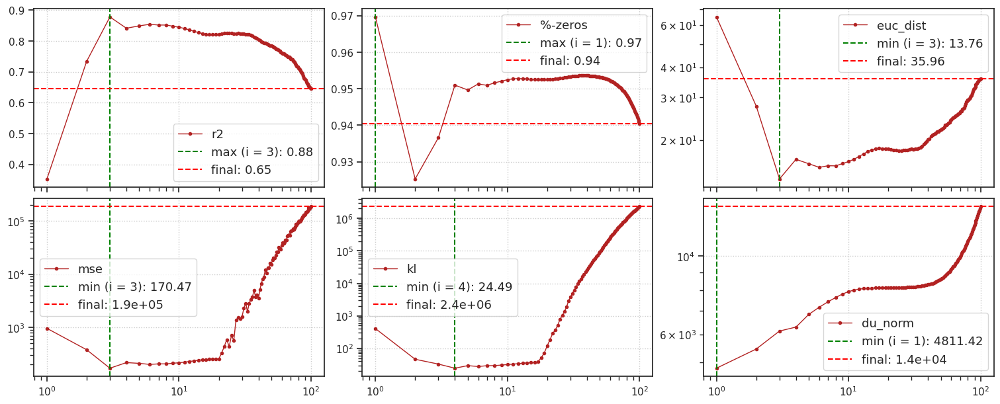

CPU times: user 34.7 s, sys: 1.07 s, total: 35.8 s
Wall time: 35.6 s


batch #0, (t = 99): 100%|███████████████| 1/1 [00:21<00:00, 21.70s/it]


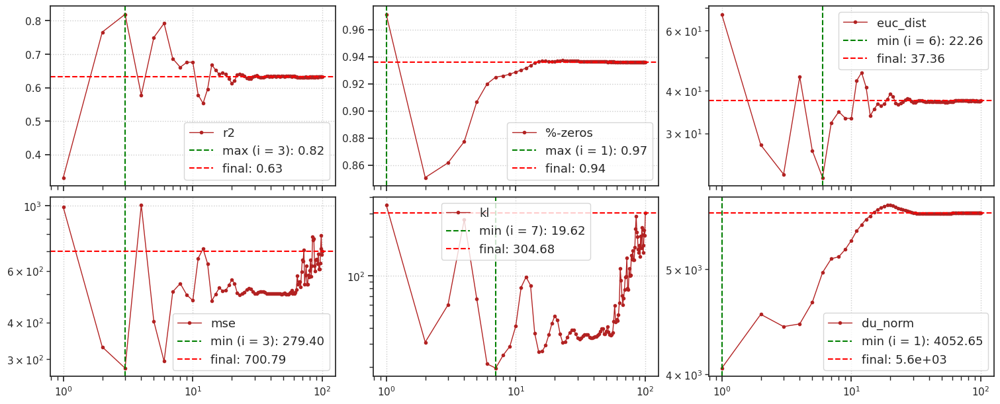

CPU times: user 22.6 s, sys: 365 ms, total: 23 s
Wall time: 22.9 s


In [36]:
## Was: fwd-(3,7)

batch #0, (t = 99): 100%|███████████████| 1/1 [00:01<00:00,  1.88s/it]


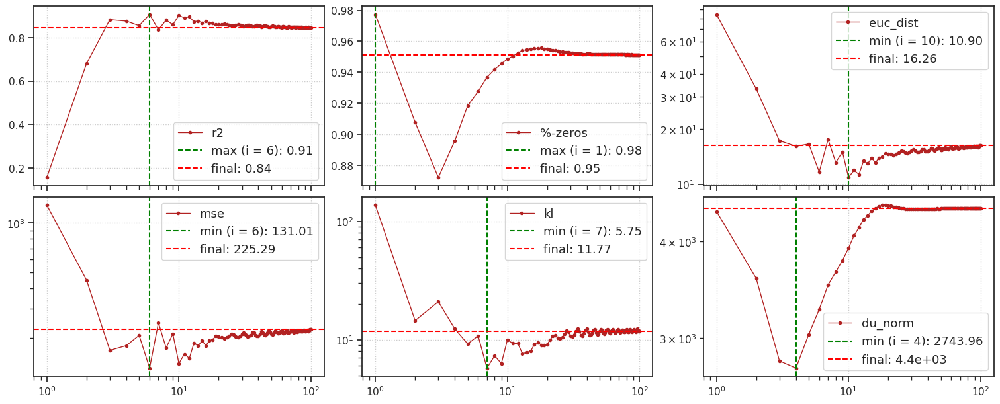

CPU times: user 2.98 s, sys: 188 ms, total: 3.16 s
Wall time: 3.12 s


In [114]:
## Was: fwd-(3,0)

### xtract celeba features

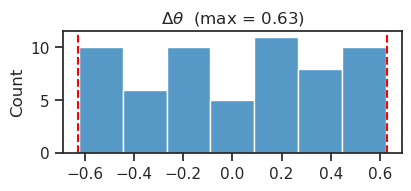

In [22]:
feeder_celeba = tr.feeder_vld.fork(
    reinit=True,
    x=x_gray_masked,
    y=vld[1][:n_samples],
    shuffle=False,
    drop_last=False,
    batch_size=60,
    max_delta_theta=tr.feeder_vld.max_delta_theta * 28 / x_gray_masked.shape[-1],
)
d_thetas = feeder_celeba.apply_anneal(-1)

fig, ax = create_figure(1, 1, (4, 1.8))
sns.histplot(tonp(d_thetas), ax=ax)
ax.axvline(-feeder_celeba.max_delta_theta, color='r', ls='--')
ax.axvline(feeder_celeba.max_delta_theta, color='r', ls='--')
ax.set_title(r"$\Delta \theta$" + f"  (max = {feeder_celeba.max_delta_theta:0.2f})")
plt.show()

In [23]:
%%time


output = tr.xtract_ftr(
    data=feeder_celeba,
    t_total=1000,
    save_freq=1,
    n_data_batches=-1,
    return_state=False,
    return_recon=True,
    verbose=True,
)
list(output)

batch #6, (t = 1000): 100%|█████████████| 6/6 [05:36<00:00, 56.12s/it]

CPU times: user 5min 24s, sys: 12.6 s, total: 5min 37s
Wall time: 5min 36s


['r2', 'mse', 'du_norm_0', 'recon', 'true', 'times']

In [24]:
r2_samples = tonp(compute_r2(
    true=feeder_celeba.to(output['true'][:, -1]),
    pred=feeder_celeba.to(output['recon'][:, -1]),
))
r2_samples.shape

(360,)

In [25]:
r2_samples_positive = r2_samples[r2_samples > 0] 

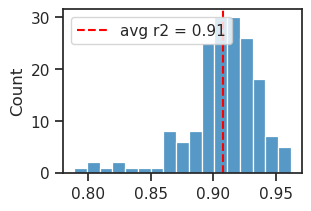

In [26]:
fig, ax = create_figure()

mean_r2 = np.mean(r2_samples_positive)
sns.histplot(r2_samples_positive, ax=ax)
ax.axvline(mean_r2, color='r', ls='--', label=f"avg r2 = {mean_r2:0.2f}")
plt.legend()
plt.show()

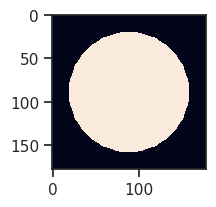

In [27]:
mask_thres = 0.2
imshow(mask_mnist_up > mask_thres)
plt.show()

In [28]:
from skimage.transform import resize

x2p = output['true'][:, 0].squeeze()
x2p = resize(x2p, output_shape=(len(x2p), 40, 40), anti_aliasing=True)

x2p.shape

(360, 40, 40)

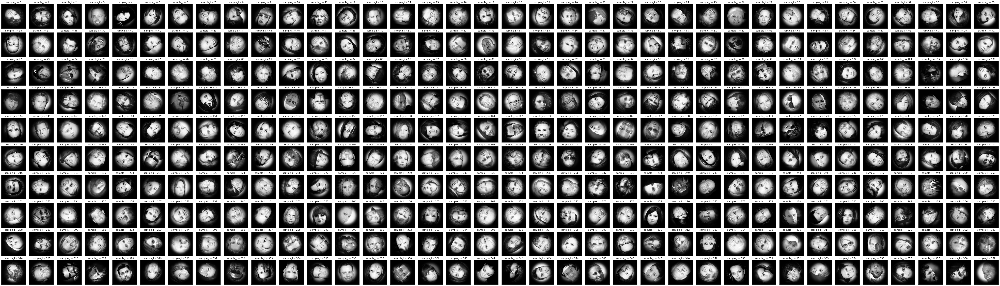

CPU times: user 1min 54s, sys: 198 ms, total: 1min 55s
Wall time: 1min 54s


In [29]:
%%time

fig, axes = create_figure(10, 36, (36 * 2.0, 10 * 2.05), 'all', 'all')

x2p = output['true'][:, 0].squeeze()
for i in range(len(x2p)):
    ax = axes.flat[i]
    ax.imshow(x2p[i], cmap='Greys_r')
    ax.set_title(f'sample_i = {i}')

remove_ticks(axes, False)
plt.show()

In [35]:
# selected_incides = [115, 6, 53, 4, 328, 153, 318, 255, 256, 185]
selected_incides = [115, 6, 53, 4, 328, 153, 318, 255, 256, 185]
r2_samples[selected_incides]

array([-1.0792241e+03,  9.3437189e-01,  9.1312343e-01, -1.0566971e+03,
       -8.5807233e+02, -7.2292377e+02,  9.3188328e-01,  9.4205397e-01,
       -9.2115869e+02, -1.2977791e+03], dtype=float32)

In [36]:
true_to_anim = output['true'][selected_incides]
recon_to_anim = output['recon'][selected_incides]

true_to_anim, recon_to_anim = filter_boundaries(
    [true_to_anim, recon_to_anim],
    mask=mask_mnist_up > mask_thres,
)

true_to_anim.shape, recon_to_anim.shape

((10, 1000, 1, 138, 138), (10, 1000, 1, 138, 138))

In [37]:
np.quantile(true_to_anim.ravel(), 0.99), np.quantile(recon_to_anim.ravel(), 0.99)

(0.8551976084709167, 11.006916093826248)

In [38]:
mp4_file_name = '_'.join([
    f"{tr.model.cfg.dataset}-to-CelebA{true_to_anim.shape[-1]}",
    f"ids-{set(selected_incides)}".replace(', ', ','),
    tr.model.cfg.str_kms,
    tr.model.cfg.str_fwd,
    f"dtheta-{tr.model.cfg.feeder_cfg['max_delta_theta']}",
])
mp4_file_name = f"{mp4_file_name}.mp4"

print(mp4_file_name)

MNIST+rotate-to-CelebA138_ids-{256,185,4,6,328,115,53,153,318,255}_kms-(512,58,3)_fwd-(1,3)_dtheta-4.0.mp4

[DONE] animation saved:
/home/hadi/Dropbox/git/jb-progress-2025/tmp/animations/ood/MNIST+rotate-to-CelebA138_ids-{256,185,4,6,328,115,53,15
3,318,255}_kms-(512,58,3)_fwd-(1,3)_dtheta-4.0.mp4

CPU times: user 54.3 s, sys: 632 ms, total: 54.9 s
Wall time: 55.6 s


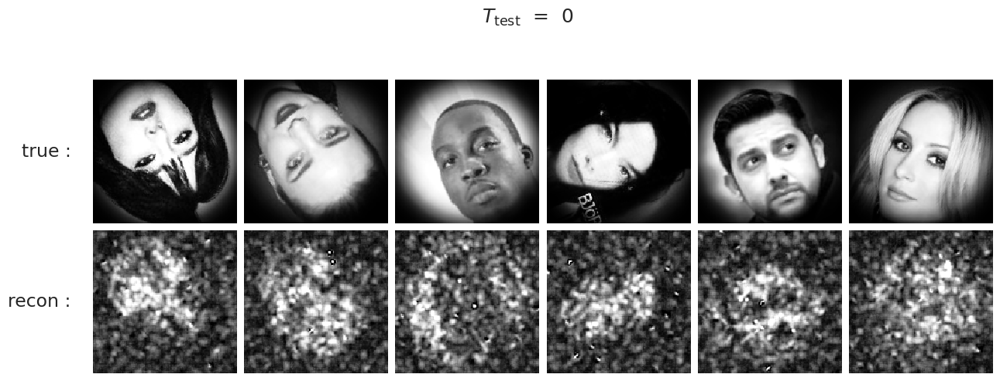

In [40]:
%%time


_ = animate_recons(
    save_file=pjoin(anim_dir, mp4_file_name),
    recon=recon_to_anim,
    true=true_to_anim,
    n_samples=6,
    vmin=0.0,
    vmax=0.85,
    figsize=(15.0, 5.5),
    # dry_run=True,
    dpi=100,
)